In [1]:
import datawrangler as dw
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
from matplotlib import pyplot as plt
from scipy.spatial.distance import cdist
from scipy.stats import ttest_ind, ttest_rel

import warnings
import os
import pickle
from tqdm.auto import tqdm
import datetime as dt

from loader import DATA_DIR, load, get_formatted_data, get_test_day, str2dt
from fitness import format_text

# enable and import IterativeImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge

# Load in summary of behavioral data

In [2]:
with open(os.path.join(DATA_DIR, 'behavioral_summary.pkl'), 'rb') as f:
    behavioral = pickle.load(f)

    
# convert all columns to numeric
for c in behavioral.columns:
    behavioral[c] = pd.to_numeric(behavioral[c])

# Load in time-varying fitness data

Normalize all dates to be relative to the test day

In [3]:
data = get_formatted_data()
fitness_data = data['fitbit']
behavioral_data = data['experiment']

_, _, survey = load(recent=7, baseline=30)
# clean up survey columns
columns = [': '.join(c) if len(c[0]) > 0 else c[1] for c in survey.columns]
columns = [c.replace(' / ', '/') for c in columns]
survey = pd.DataFrame(index=survey.index, columns=columns, data=survey.values, dtype=np.float32).drop('current/typical stress', axis=1)

test_days = get_test_day(behavioral_data)

In [4]:
# ignore non-numeric values
def as_numeric(df):
    x = pd.DataFrame(index=df.index, columns=df.columns)
    for i in df.index:
        x.loc[i] = pd.to_numeric(df.loc[i], errors='coerce')
    return x


def normalize_date_indices(data, test_days):
    x = []
    for i, d in tqdm(enumerate(data)):
        d = as_numeric(d)
        
        diffs = [str2dt(t) - test_days[i] for t in d.index.values]
        
        # round to nearest day
        days = np.array([dt.timedelta(seconds=np.round(d.total_seconds())).days for d in diffs])
        
        # average values when the day is duplicated
        unique_days, counts = np.unique(days, return_counts=True)        
        next_x = pd.DataFrame(index=unique_days, columns=d.columns)
        
        for m in unique_days:
            next_x.loc[m] = d.loc[days == m].mean(axis=0)
                        
        # remove any positive days (after the test day)
        inds = unique_days <= 0
        prior_days = [dt.timedelta(days=int(p)) for p in unique_days[inds]]
        x.append(pd.DataFrame(index=prior_days, columns=d.columns, data=next_x.loc[unique_days[inds]].values))
    return x

In [5]:
normed_fitness_data = normalize_date_indices(fitness_data, test_days)

0it [00:00, ?it/s]

In [6]:
# clean up normed fitness data

# remove non-numeric columns and rarely tracked columns
remove = ['battery', 'bmi', 'bodyfat', 'sync', 'tracker', 'water', 'device']
normalize = {'sleep_duration': 1 / (1000 * 60 * 60)} # convert sleep ms to hours

for i, f in enumerate(normed_fitness_data):
    normed_fitness_data[i] = f.drop([c for c in f.columns if any([r in c.lower() for r in remove])], axis=1)
    
    for key, norm in normalize.items():
        for c in [x for x in normed_fitness_data[i].columns if key in x.lower()]:
            normed_fitness_data[i][c] *= norm

# Set up reverse correlation analysis

In [7]:
def weighted_average(x, weights, res='day', min_weight=0.001):
    def union(x):
        u = set()
        for i in x:
            u = u.union(set(i))
        u = list(u)
        u.sort()
        return u
    
    def get(i, idx, col):
        if (idx in i.index) and (col in i.columns):
            return i.loc[idx, col]
        else:
            return np.nan
    
    def nan_wmean_wstd(weights, vals):
        good_inds = ~(np.isnan(weights) | np.isnan(vals))
        w = weights[good_inds]
        v = vals[good_inds]
        
        if len(v) == 0:
            return np.nan, np.nan, 0
        elif len(v) == 1:
            return v, 0, 1
        else:
            average = np.average(v, weights=w)
            variance = np.average((v - average) ** 2, weights=w)
            return np.average(v, weights=w), np.sqrt(variance), np.sum(good_inds)
        
    
    columns = union([i.columns for i in x])
    indices = union([i.index for i in x])
    
    average = pd.DataFrame(index=indices, columns=columns)
    std = average.copy()
    counts = average.copy()
    
    # scale weights to be between min_weight and 1
    weights -= np.min(weights)
    weights /= np.max(weights)
    weights *= (1 - min_weight)
    weights += min_weight
    
    if np.all(np.isnan(weights)):
        weights = pd.Series(data=np.divide(np.ones_like(weights), len(weights)),
                               index=weights.index, dtype=np.float32)    
    
    for idx in tqdm(indices):
        for col in columns:
            vals = pd.Series(index=weights.index, data=[get(i, idx, col) for i in x])
            try:
                average.loc[idx, col], std.loc[idx, col], counts.loc[idx, col] = nan_wmean_wstd(weights, vals)
            except:
                continue
    
    return average, std, counts

# Generate reverse correlation timeseries for each behavioral measure

In [8]:
rev_corrs = {b: weighted_average(normed_fitness_data, behavioral[b]) for b in behavioral.columns}
baseline = weighted_average(normed_fitness_data, pd.Series(index=behavioral['Free recall (immediate)'].index,
                                                           data=np.ones(behavioral['Free recall (immediate)'].shape)))

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

In [9]:
# generate smoothed reverse correlations
rolling = [fd.rolling(7, min_periods=1, axis=0).mean() for fd in normed_fitness_data]

rev_corrs_smooth = {b: weighted_average(rolling, behavioral[b]) for b in behavioral.columns}
baseline_smooth = weighted_average(rolling, pd.Series(index=behavioral['Free recall (immediate)'].index,
                                                      data=np.ones(behavioral['Free recall (immediate)'].shape)))

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

In [10]:
tasks = ['Free recall', 'Naturalistic recall', 'Foreign language flashcards', 'Spatial learning']
tc = {t: c for t, c in zip(tasks, ['#3FA9F5', '#7AC943', '#FF931E', ['#FF1D25', '#B20209']])}

task_colors = {}
for t in tasks:
    if 'spatial' in t.lower():
        conds = ['intercept', 'slope']
        colors = tc[t]
    else:
        conds = ['immediate', 'delayed']
        colors = [tc[t], tc[t]]
    
    for i, c in enumerate(conds):
        task_colors[f'{t} ({c})'] = colors[i]

In [11]:
def format_measure(m):
    caps = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
    lowercase = caps.lower()
    
    if len(m) == 0:
        return m
        
    f = m[0]
    recent_space = False
    for i, c in enumerate(m[1:]):
        if c in caps and m[i - 1] in caps:
            f += c
        elif c in lowercase and m[i - 1] in lowercase:
            f += c
        else:
            if recent_space:
                f += c
                recent_space = False
            else:
                f += ' ' + c
                recent_space = True    
    
    return format_text(f.replace('_', ' ')).replace('Bmi', 'BMI').replace('bmr', 'BMR').replace('Fb', 'Fat burn').replace('R ', 'R').replace('Oor', 'OOR').replace('HRval', 'HR')

In [12]:
# convert np.datetime64 values into (integer) days
def ns_to_days(dt64s):
    def convert(ns):
        # ns --> μs --> ms --> s --> minutes --> hours --> days
        return int(ns / (1000 * 1000 * 1000 * 60 * 60 * 24))
    
    return [convert(d) for d in dt64s]

In [13]:
def plot_ribbon(x, y, err, color='k', ribbon_alpha=0.1, alpha=0.8, linewidth=1, ax=None, **kwargs):
    if ax is None:
        ax = plt.gca()
    
    x = np.array(x, dtype=np.float32)
    y = np.array(y, dtype=np.float32)
    err = np.array(err, dtype=np.float32)
    
    if np.sum(~np.isnan(y)) > 0:
        ax.plot(x, y, color=color, linewidth=linewidth, alpha=alpha, **kwargs)
        ax.fill_between(x, y - err, y + err, alpha=ribbon_alpha, color=color, edgecolor=None)
    return ax

In [14]:
def plot_condition(r, m, color, ax, start_days, stop_days, hide_ylabel):
    x = ns_to_days(r[0].iloc[start_days:stop_days].index.values)
    y = r[0].iloc[start_days:stop_days][m].values
    
    divisor = np.power(np.maximum(r[2].iloc[start_days:stop_days][m].values - 1,
                                  np.zeros_like(r[2].iloc[start_days:stop_days][m].values)), 0.5)
    err = [std_dev / sqrt_n if (sqrt_n > 0) else np.nan for std_dev, sqrt_n in
           zip(r[1].iloc[start_days:stop_days][m].values, divisor)]
    err = np.array([e if not np.isnan(e) else 0 for e in err])
    
    plot_ribbon(x, y, err, color=color, ax=ax)
    ax.set_xlabel('Days relative to test', fontsize=14)
    
    if not hide_ylabel:
        ax.set_ylabel(format_measure(m), fontsize=14)

In [15]:
def rolling_ttests(x, y, window):
    x = pd.to_numeric(x)
    y = pd.to_numeric(y)
    
    ps = np.zeros_like(x)
    for i in range(len(x)):
        start_ind = int(np.max([0, i - np.floor(window/2)]))
        stop_ind = int(np.min([len(x), i + np.ceil(window/2)]))
        next_x = x.iloc[start_ind:stop_ind]
        next_y = y.iloc[start_ind:stop_ind]
        
        _, ps[i] = ttest_rel(next_x, next_y, nan_policy='omit')
    return pd.Series(data=ps, index=x.index)


def plot_stats(stats, colors, ax, ylim, pthresh, skip=0):    
    shift_delta = -0.01 * (ylim[1] - ylim[0])
    shift = -skip * shift_delta
        
    for task, ps in stats.items():
        ax.plot(ns_to_days(ps.index.values), (ylim[0] - shift) * np.multiply(np.ones_like(ps.values), [1 if p < pthresh else np.nan for p in ps.values]),
                color=colors[task], linewidth=1, alpha=0.9)
        shift += shift_delta    

In [16]:
# skip days -365 and 0-- most trackers count current day (0) as the start of the 365 day interval, but
# most participants didn't sync their trackers on the test day.  Remove those days to get rid of sync-
# related artifacts.

def plot_reverse_correlations(results, baseline, colors, start_days=-364, stop_days=-1, ttest_width=30, pthresh=0.05, ncol=2):
    warnings.simplefilter('ignore')
    
    measures = results[list(results.keys())[0]][0].columns
    
    if ncol == 2:
        figsize = (15, 5)
    else:
        figsize = (7, 5)
    
    all_figs = {}
    for m in measures:
        fig, axes = plt.subplots(nrows=1, ncols=ncol, figsize=figsize, sharey=True)
        
        next_stats = {}
        for task in colors.keys():
            if 'spatial' in task.lower():
                conds = {'intercept': axes[0], 'slope': axes[0]}
            elif ncol == 2:
                conds = {'immediate': axes[0], 'delayed': axes[1]}
            else:
                conds = {'': axes}
            
            hide_ylabel = False
            for c, ax in conds.items():
                if ax not in next_stats.keys():
                    next_stats[ax] = {}
                if c in task.lower():
                    plot_condition(results[task], m, colors[task], ax, start_days, stop_days, hide_ylabel)                    
                    next_stats[ax][task] = rolling_ttests(results[task][0].iloc[start_days:stop_days][m],
                                                          baseline[0].iloc[start_days:stop_days][m],
                                                          ttest_width)
                hide_ylabel = True
        
        if ncol == 2:
            ylim = [np.min([ax.get_ylim()[0] for ax in axes]),
                    np.max([ax.get_ylim()[1] for ax in axes])]
        
            #skip = 0
            hide_ylabel = False
            for ax in axes:
                plot_condition(baseline, m, 'k', ax, start_days, stop_days, hide_ylabel)
                plot_stats(next_stats[ax], colors, ax, ylim, pthresh / np.abs(start_days - stop_days), skip=0) # bonferroni correction for number of tests run

                ax.set_xlim([start_days, stop_days])
                #skip = 2 # align delayed and immediate stats bars (no delayed spatial task, so skip 2 measures)
                hide_ylabel = True
        else:
            ylim = axes.get_ylim()
            plot_condition(baseline, m, 'k', axes, start_days, stop_days, False)
            plot_stats(next_stats[axes], colors, axes, ylim, pthresh / np.abs(start_days - stop_days), skip=10) # bonferroni correction for number of tests run

            axes.set_xlim([start_days, stop_days])
            
        
        all_figs[format_measure(m)] = fig
        
    return all_figs

# Create unsmoothed figures

(For debugging and reference)

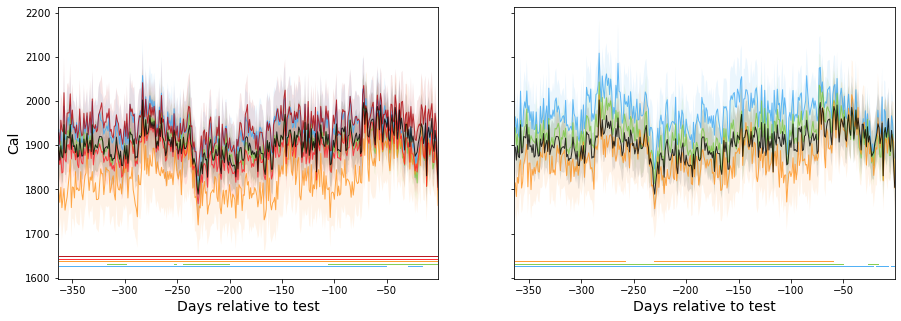

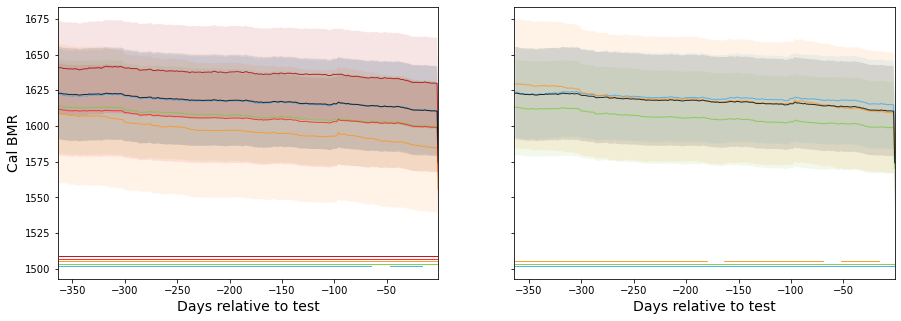

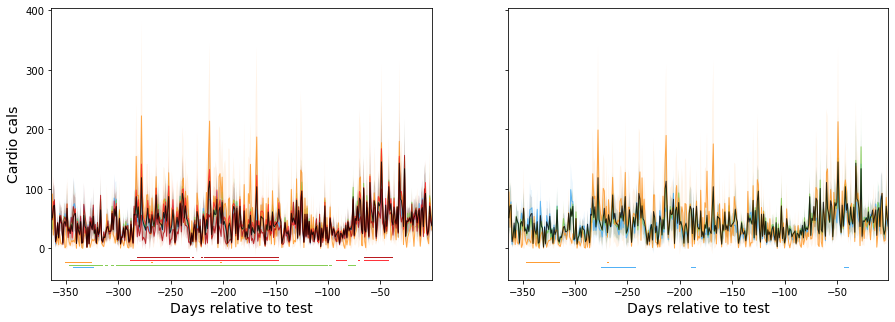

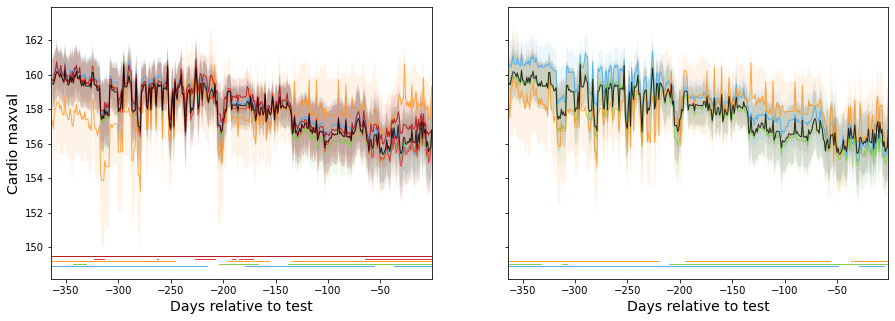

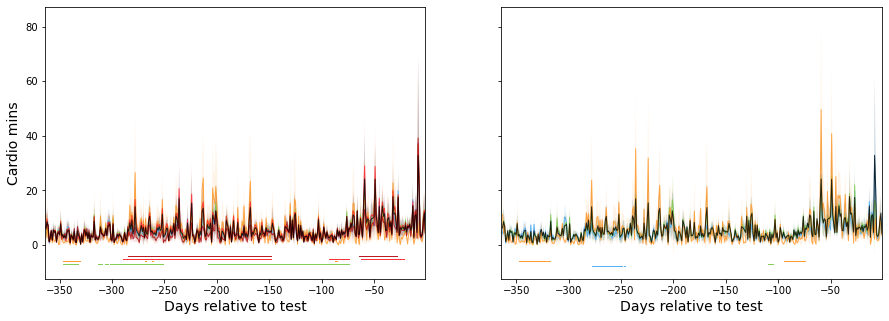

...

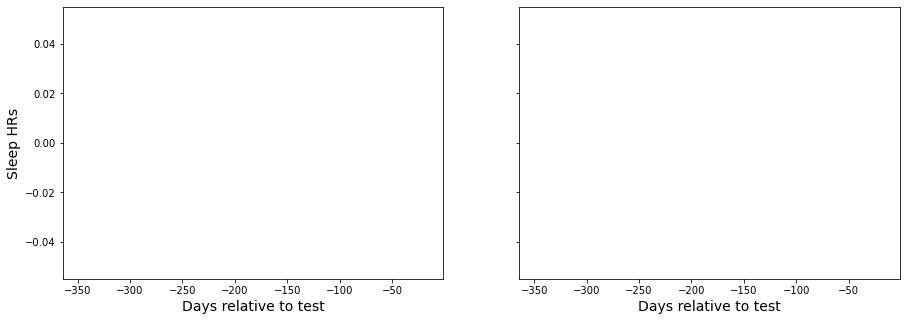

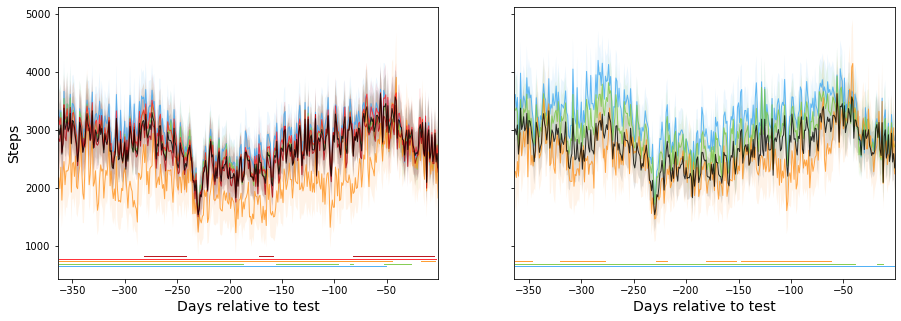

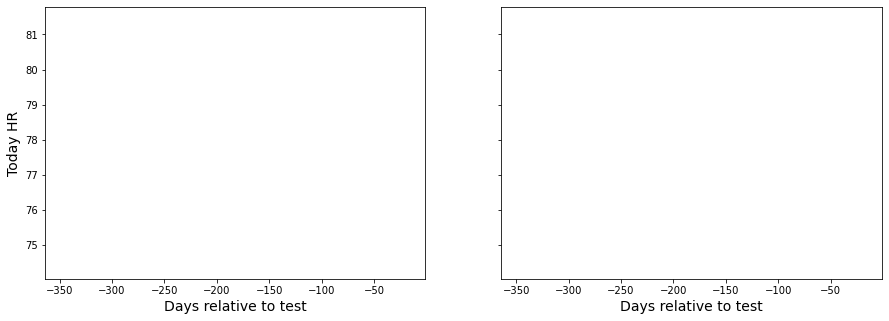

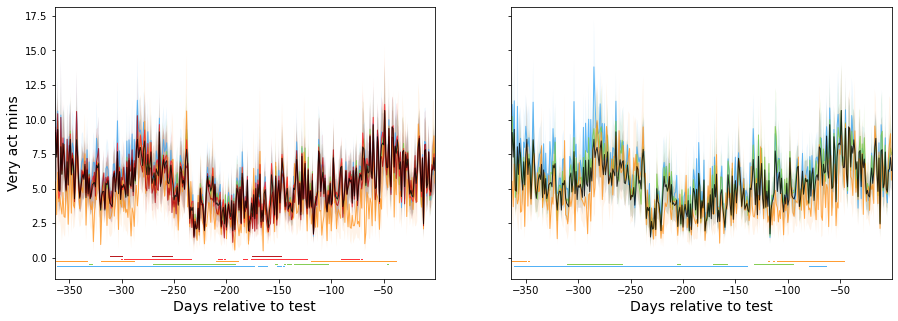

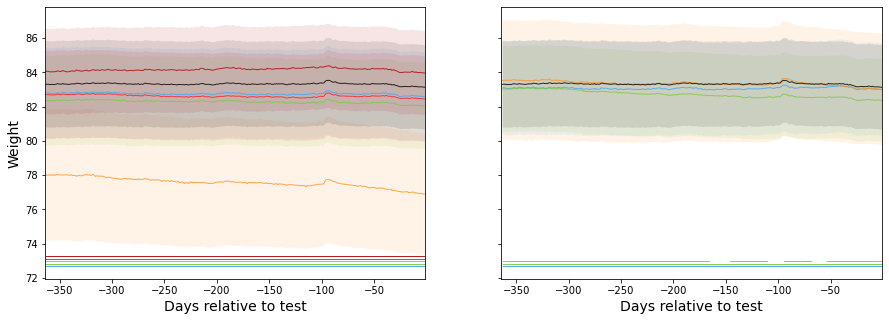

In [17]:
figs = plot_reverse_correlations(rev_corrs, baseline, task_colors)
for key, fig in figs.items():
    fig.savefig(f'{key.lower()}_timecourse.pdf')

# Create smoothed figures

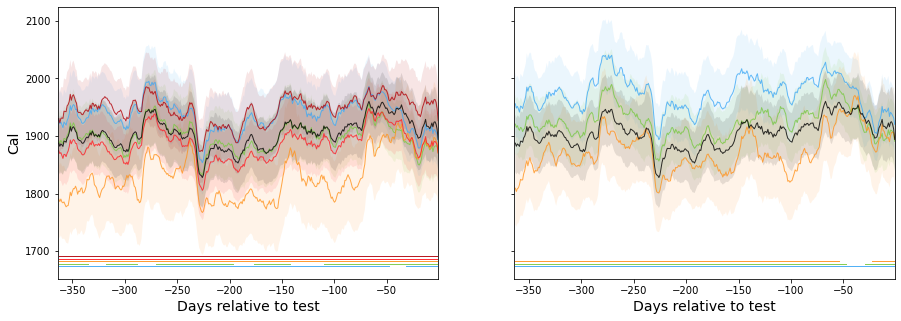

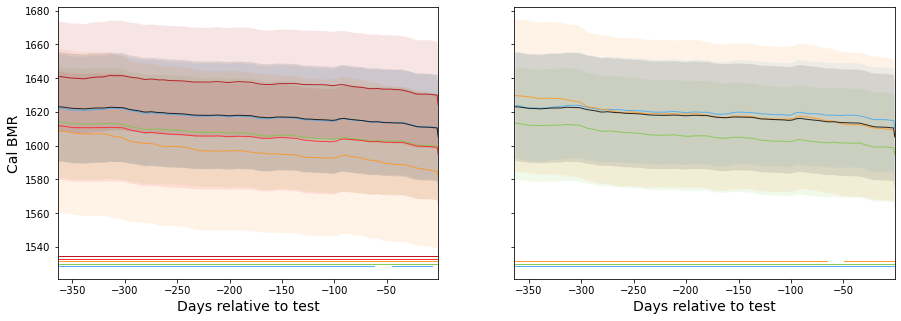

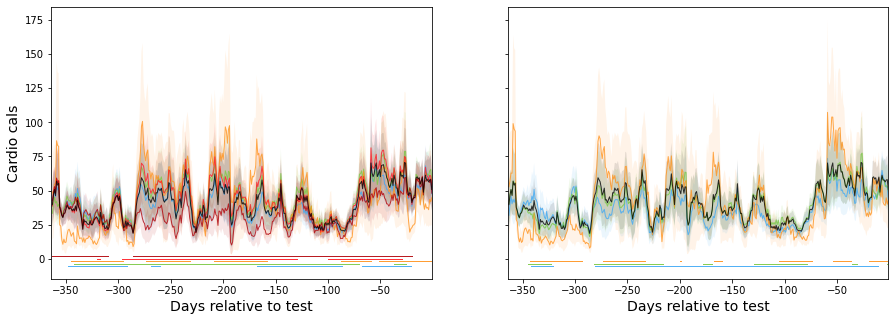

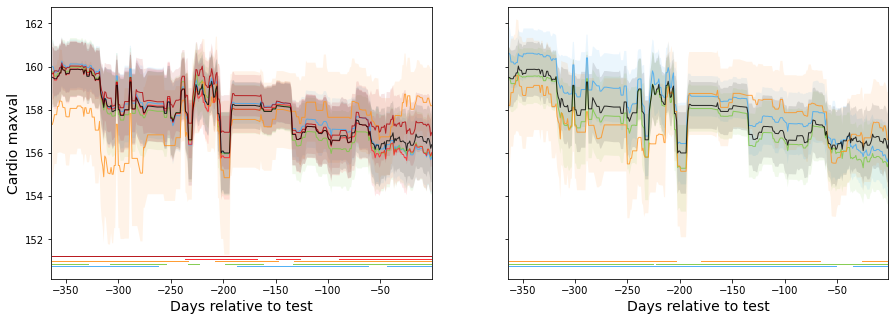

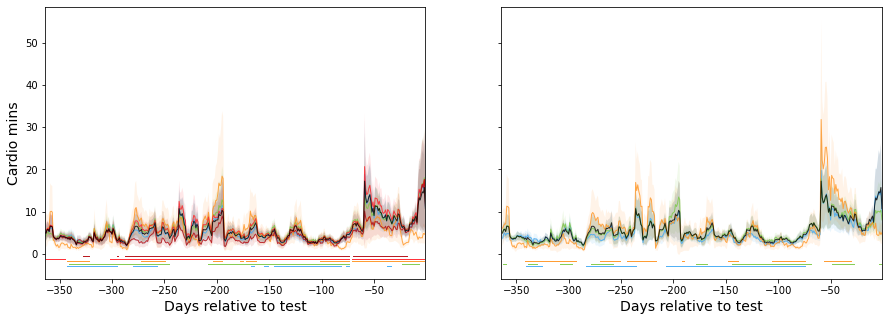

...

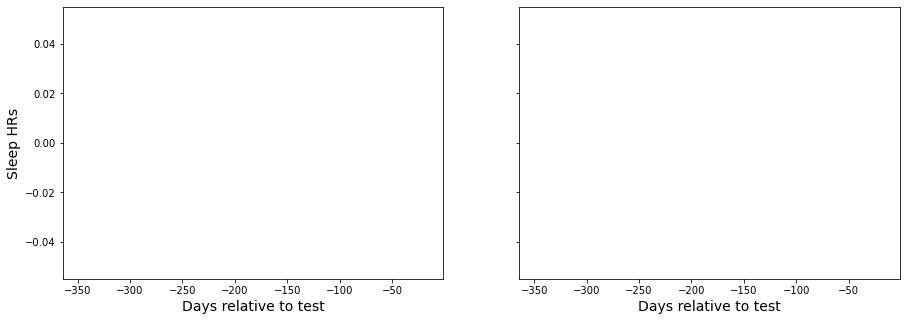

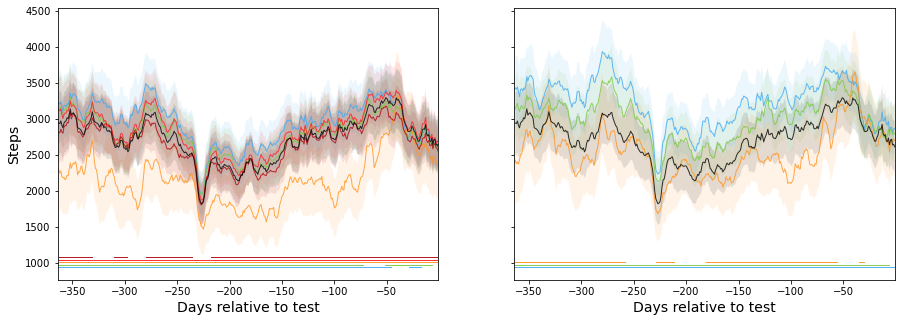

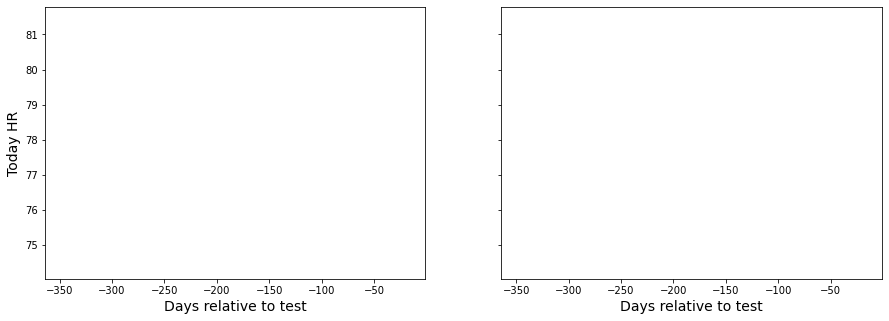

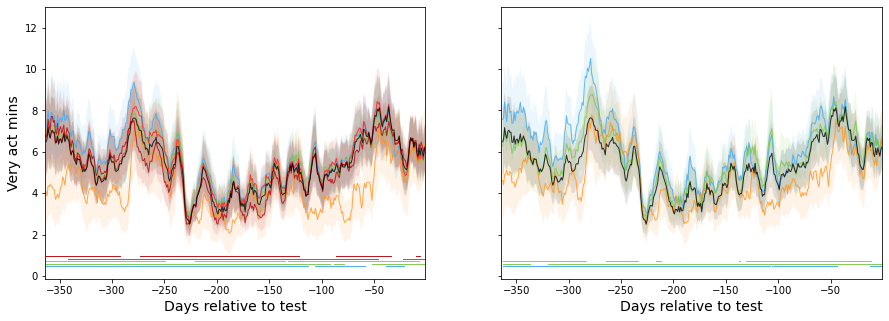

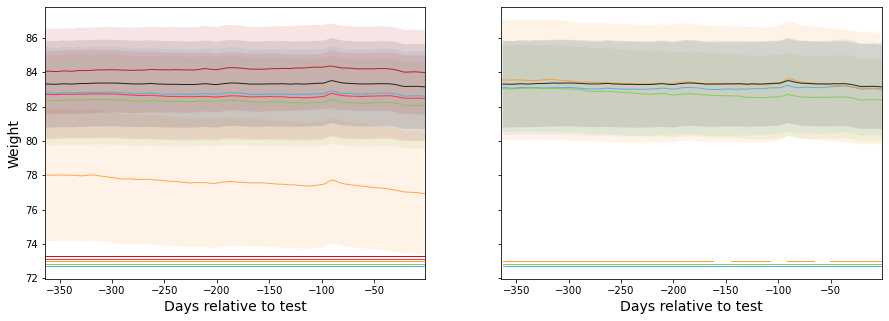

In [18]:
figs = plot_reverse_correlations(rev_corrs_smooth, baseline_smooth, task_colors)
for key, fig in figs.items():
    fig.savefig(f'{key.lower()}_smooth_timecourse.pdf')

# Explore mental health dimensions

In [19]:
def remove_prefix(s):
    if ':' in s:
        return s[s.find(':')+1:].strip()
    else:
        return s

In [20]:
mental_health_dims = ['health and wellness', 'stress']
mental_health_corrs = {remove_prefix(m): weighted_average(rolling, survey[m]) for m in survey.columns
                       if any([h in m.lower() for h in mental_health_dims])}

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

  0%|          | 0/833 [00:00<?, ?it/s]

In [21]:
mental_health_colors = {m: c for m, c in zip(mental_health_corrs.keys(), sns.color_palette('husl', n_colors=len(mental_health_corrs)))}
stress_colors = {k: v for k, v in mental_health_colors.items() if 'stress' in k.lower()}

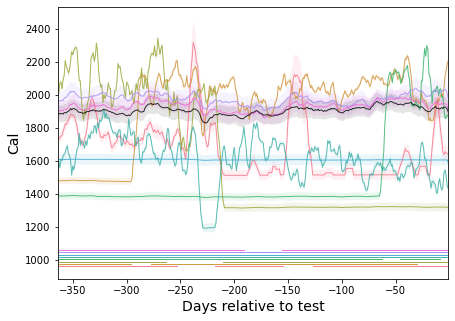

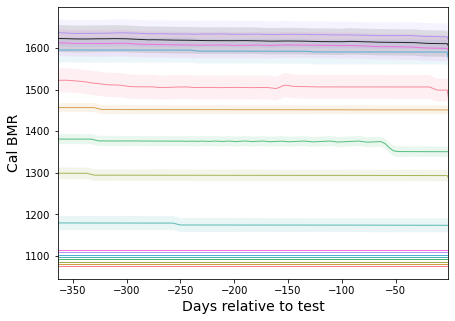

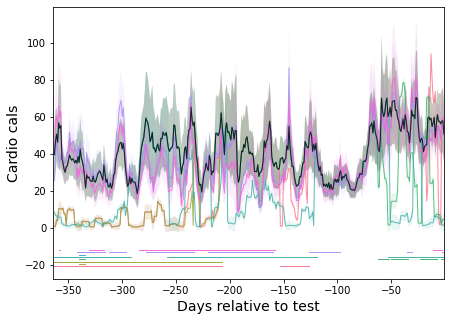

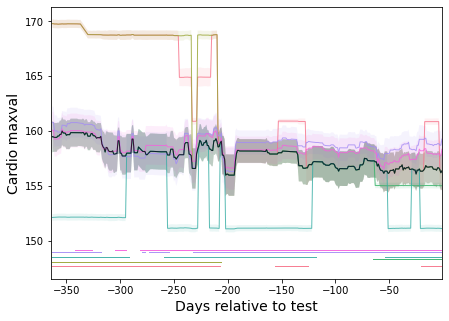

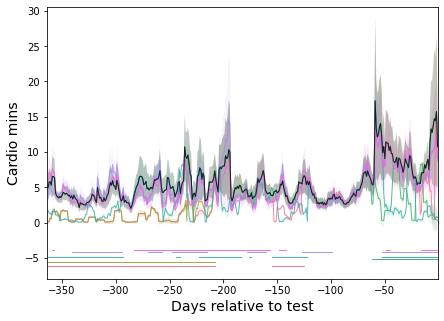

...

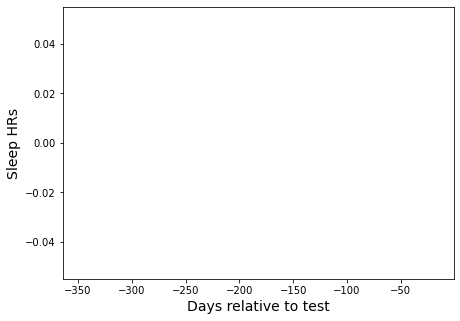

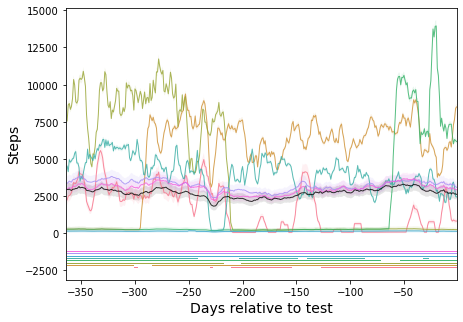

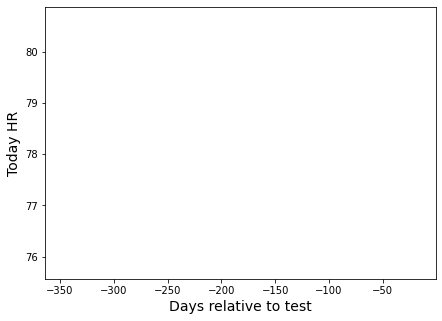

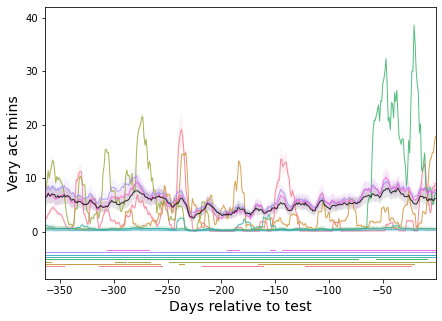

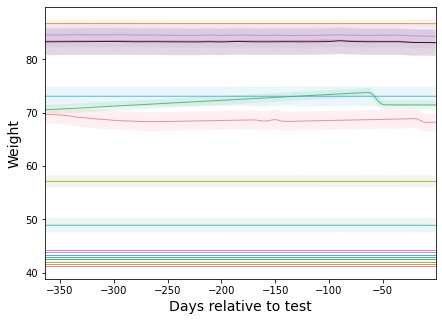

In [22]:
figs = plot_reverse_correlations(mental_health_corrs, baseline_smooth, mental_health_colors, ncol=1)
for key, fig in figs.items():
    fig.savefig(f'{key.lower()}_smooth_timecourse_MH.pdf')

## Split out "stress" levels and create a separate set of plots

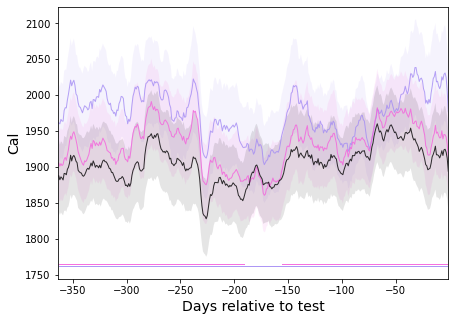

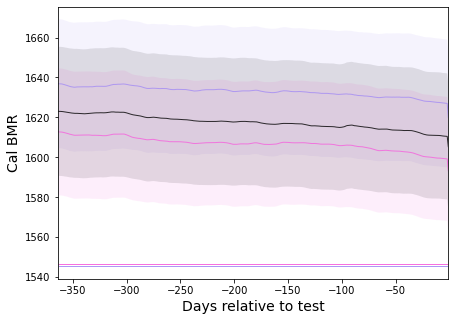

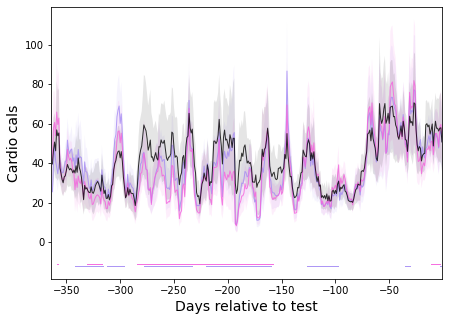

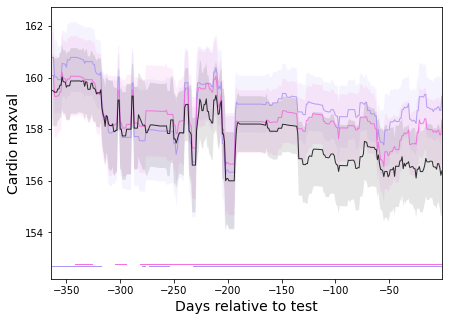

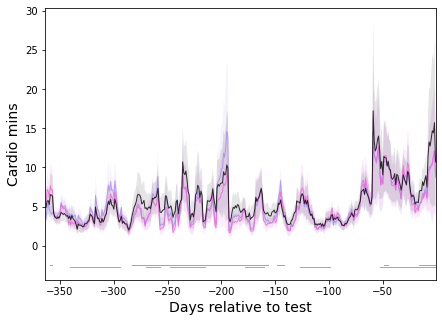

...

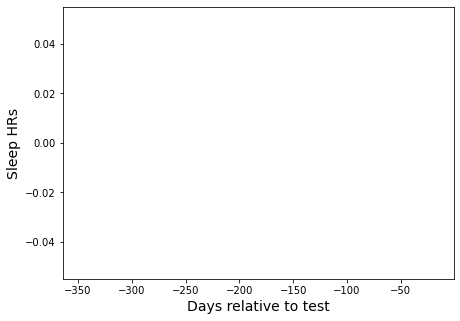

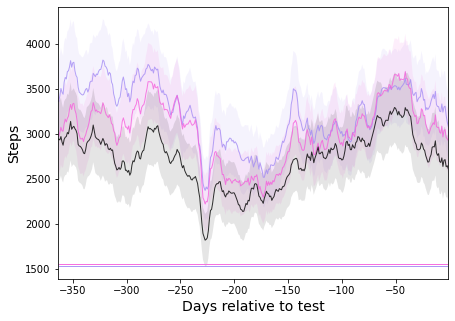

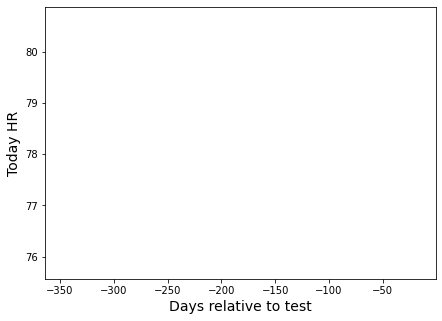

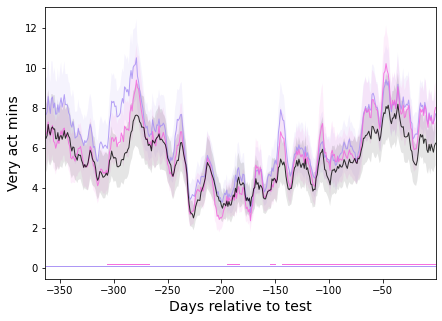

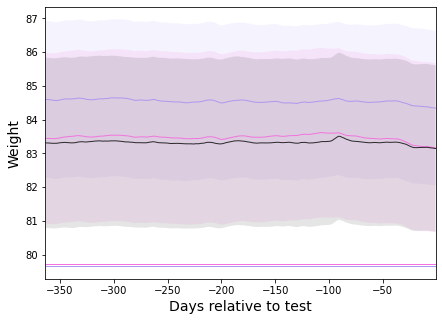

In [23]:
stress_corrs = {k: v for k, v in mental_health_corrs.items() if 'stress' in k.lower()}

figs = plot_reverse_correlations(stress_corrs, baseline_smooth, stress_colors, ncol=1)
for key, fig in figs.items():
    fig.savefig(f'{key.lower()}_smooth_timecourse_MH_stress_only.pdf')

# Plot legends

In [24]:
def plot_legend(colors, textshift=0.65, scale=2, buffer=0.1, sort=False):
    fig = plt.figure()
    ax = plt.gca()
    
    keys = list(colors.keys())
    if sort:
        keys.sort()
    keys.append('Baseline')
    colors['Baseline'] = 'k'
    
    for i, c in enumerate(keys):
        ax.plot(0, len(colors) - i, 's', color=colors[c], markerfacecolor=colors[c], markersize=10, markeredgecolor=None)
        plt.text(buffer, len(colors) - i - 1/(textshift * len(colors)), c.capitalize().replace('/', ' / '), fontsize=14)
    
    plt.xlim([-buffer, buffer*(np.max([len(k) for k in keys]))])
    plt.ylim([-buffer, scale * len(colors) + buffer])
    plt.axis('off')
    return fig

In [25]:
task_legend_colors = {t.replace(' (immediate)', ''): c for t, c in task_colors.items() if ('immediate' in t.lower()) or ('intercept' in t.lower()) or ('slope' in t.lower())}

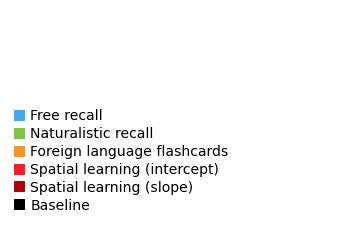

In [26]:
fig = plot_legend(task_legend_colors)
fig.savefig('task_legend.pdf')

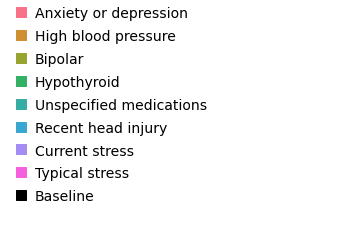

In [27]:
fig = plot_legend(mental_health_colors, textshift=0.48, scale=1, buffer=0.25)
fig.savefig('mental_health_legend.pdf')

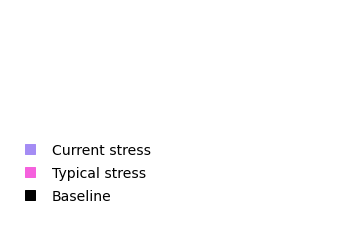

In [28]:
fig = plot_legend(stress_colors, textshift=1.5, scale=3, buffer=0.25)
fig.savefig('stress_legend.pdf')